# Flow Matching and Score Matching

In this notebook, we will learn how to train generative models using flow and score matching.

## Import Required Libraries

In [1]:
!pip install -qU matplotlib numpy seaborn scikit-learn torch tqdm

In [2]:
# Abstract base classes (ABCs) and abstract methods define signatures without
# implementations, acting as templates that all subclasses must follow to be
# instantiated. Abstract methods are marked by the @abstractmethod decorator.
from abc import ABC, abstractmethod

# The Optional type hint specifies that a variable may be of a given type or of
# type None. Dict, List, and Tuple indicate containers parameterized by their
# constituent type(s), while Type denotes objects or subclasses of a specified
# type.
from typing import Optional, Dict, List, Tuple, Type

# The math module provides common mathematical functions and constants, NumPy
# enables efficient numerical computations, while tdqm displays a progress bar
# over loops and iterables.
import math, numpy as np
from tqdm import tqdm

# Matplotlib's pyplot provides a plotting interface. The Axes class represents
# an individual subplot within a Figure. cm provides access to colormaps, while
# Seaborn extends Matplotlib with additional tools for statistical data visuali-
# zation.
import matplotlib.pyplot as plt, matplotlib.axes._axes as Axes, matplotlib.cm as cm
import seaborn as sns

# PyTorch is a framework that facilitates the training of ML models. Its distri-
# butions module provides a wide range of probability distributions. The func mo-
# dule provides higher-order functions which transform existing functions. In par-
# ticular, vectorizing maps enable efficient batching of operations over multiple
# samples, while the Jacobian matrix contains the first-order partial derivatives
# of a function, i.e., partial f_i / partial x_j.
import torch
import torch.distributions as D
from torch.func import vmap, jacrev

# make_moons and make_circles create interleaving half circles and concentric
# circles, respectively. These represent binary classification datasets that
# are challenging for algorithms that rely on linear decision boundaries or
# centroid-based assumptions.
from sklearn.datasets import make_moons, make_circles

# Set the device to CUDA if a GPU is available; otherwise, fall back to the CPU.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

%matplotlib inline
plt.rcParams["font.family"] = "DejaVu Sans Mono"

In [3]:
class Sampleable(ABC):
    """
    Distribution that can be sampled from.
    """
    @property
    @abstractmethod
    def dim(self) -> int:
        """
        Return the dimensionality of a sampleable distribution.

        Returns
        -------
        int
            Dimensionality of the distribution
        """
        pass

    @abstractmethod
    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Generate samples from the distribution.

        Parameters
        ----------
        num_samples : int
            Number of samples to generate (i.e., batch size)

        Returns
        -------
        samples : torch.Tensor, shape (num_samples, dim)
            Samples from the distribution.
        """
        pass

In [4]:
class Density(ABC):
    """
    Probability distribution with tractable (measurable) density.
    """
    @abstractmethod
    def log_density(self, x: torch.Tensor) -> torch.Tensor:
        """
        Compute the log probability density for a batch of samples.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Batch of samples.

        Returns
        -------
        log_density : torch.Tensor, shape (batch_size, 1)
            Log density [log p(x)] for each sample.
        """
        pass

In [5]:
class Gaussian(torch.nn.Module, Sampleable, Density):
    """
    Multivariate Gaussian distribution that can both be measured (Density) and
    sampled from (Sampleable). Wraps around PyTorch's MultivariateNormal distri-
    bution.
    """
    def __init__(self, mean: torch.Tensor, cov: torch.Tensor):
        """
        Initialize a multivariate Gaussian distribution.

        Parameters
        ----------
        mean : torch.Tensor, shape (dim, )
            Mean vector of the distribution.
        cov : torch.Tensor, shape (dim, dim)
            Covariance matrix of the distribution.
        """
        # The constructor of the first base class (Module) is called.
        super().__init__()
        # Register the mean and covariance as buffers so that they are tracked
        # as part of the module state but not treated as learnable parameters.
        self.register_buffer("mean", mean)
        self.register_buffer("cov", cov)

    @property
    def dim(self) -> int:
        """
        Returns the dimensionality of the Gaussian, defined as the number of
        elements in its mean vector.
        """
        return self.mean.shape[0]

    @property
    def distribution(self):
        """
        Returns the underlying multivariate normal distribution with the stored
        mean and covariance. Disable argument validation to reduce overhead, and
        expose as a read-only property (attribute).

        Returns
        -------
        torch.distributions.MultivariateNormal
            Multivariate Gaussian parameterized by the stored mean and covari-
            ance.
        """
        return D.MultivariateNormal(self.mean, self.cov, validate_args = False)

    def sample(self, num_samples) -> torch.Tensor:
        """
        Draw random samples from the Gaussian distribution.

        Parameters
        ----------
        num_samples : int
            Number of samples to draw from the distribution.

        Returns
        -------
        torch.Tensor, shape (num_samples, dim)
            Random samples drawn from the distribution.
        """
        return self.distribution.sample((num_samples, ))

    def log_density(self, x: torch.Tensor):
        """
        Compute the log probability density for the given input values.

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Points at which to evaluate the log density.

        Returns
        -------
        torch.Tensor, shape (num_samples, 1)
            Log probability densities evaluated at the given points, reshaped
            into a column vector.
        """
        return self.distribution.log_prob(x).view(-1, 1)

    @classmethod
    def isotropic(cls, dim: int, std: float) -> "Gaussian":
        """
        Create an isotropic multivariate Gaussian N(0, std^2 * I) with the given
        dimensionality and standard deviation.

        Parameters
        ----------
        dim : int
            Number of dimensions.
        std : float
            Standard deviation for all dimensions.

        Returns
        -------
        Gaussian
            Zero-mean, isotropic multivariate Gaussian with covariance std^2 * I.
        """
        mean = torch.zeros(dim)
        cov = torch.eye(dim) * std ** 2
        return cls(mean, cov)

In [6]:
class GaussianMixture(torch.nn.Module, Sampleable, Density):
    """
    Two-dimensional Gaussian mixture model that supports both density evaluation
    (Density) and sampling (Sampleable). Wraps PyTorch's MixtureSameFamily dis-
    tribution to create a mixture of Gaussian distributions, each with its own
    mean, covariance, and weight.
    """
    def __init__(self, means: torch.Tensor, covs: torch.Tensor, weights: torch.Tensor):
        """
        Initialize a Gaussian mixture model.

        Parameters
        ----------
        means : torch.Tensor, shape (nmodes, 2)
            Mean vector for each Gaussian component in the mixture. Each row re-
            presents a component's 2D mean.
        covs : torch.Tensor, shape (nmodes, 2, 2)
            Covariance matrix for each Gaussian component in the mixture. Each
            entry represents the covariance matrix of one component.
        weights : torch.Tensor, shape (nmodes, 1)
            Weights (probabilities) of selecting each component in the mixture.
            These must sum to 1, and each weight must be non-negative.
        """
        # Initialize the parent Module class
        super().__init__()
        # The number of modes is inferred from the shape of the means tensor
        self.nmodes = means.shape[0]
        # Register the means, covariances, and weights as buffers so that they
        # are tracked as part of the module state.
        self.register_buffer("means", means)
        self.register_buffer("covs", covs)
        self.register_buffer("weights", weights)

    @property
    def dim(self) -> int:
        """
        Return the dimension of the mixture model, i.e., the second dimension of
        the mean tensor.
        """
        return self.means.shape[1]

    @property
    def distribution(self):
        """
        Construct and return the mixture distribution. Use the stored weights to
        specify the probability of each component. Each component is a multivari-
        ate Gaussian parameterized by its corresponding mean and covariance ma-
        trix.

        Returns
        -------
        torch.distributions.mixture_same_family.MixtureSameFamily
            Gaussian mixture model parameterized by the stored means, covariance
            matrices, and component weights.
        """
        return D.MixtureSameFamily(mixture_distribution = D.Categorical(probs = self.weights,
                                                                        validate_args = False),
                                   component_distribution = D.MultivariateNormal(loc = self.means,
                                                                                 covariance_matrix = self.covs,
                                                                                 validate_args = False),
                                   validate_args = False)

    def log_density(self, x: torch.Tensor) -> torch.Tensor:
        """
        Compute and return the log density of the distribution, at the given po-
        sition, as a column vector.
        """
        return self.distribution.log_prob(x).view(-1, 1)

    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Sample from the 2D Gaussian mixture model and return a tensor of shape
        (num_samples, 2).
        """
        return self.distribution.sample(torch.Size((num_samples, )))

    @classmethod
    def random_2D(cls, nmodes: int, std: float, scale: float = 10.0, x_offset: float = 0.0, seed = 0.0) -> "GaussianMixture":
        """
        Construct a randomly initialized 2D Gaussian mixture model.

        Parameters
        ----------
        nmodes : int
            Number of Gaussian components (modes) in the mixture model.
        std : float
            Standard deviation for each Gaussian component. Sets the diagonal
            entries (variances) of each component's covariance matrix.
        scale : float, optional
            Scaling factor for component means. Each mean is randomly sampled
            from U(-0.5, 0.5) * scale. Default is 10.0.
        x_offset : float, optional
            Offset added to the x-coordinate of each mean. The final distribu-
            tion of means on the x-axis follows U(-0.5, 0.5) * scale + x_offset.
            Default is 0.0.
        seed : float, optional
            Random seed for reproducibility. Default is 0.0.

        Returns
        -------
        GaussianMixture
            Gaussian mixture model with randomly generated means, isotopic co-
            variance matrices, and uniform component weights.
        """
        # Set the random seed for reproducibility
        torch.manual_seed(seed)
        # Generate component means uniformly from U(-0.5, 0.5) * scale. Apply an
        # x-offset to the x-coordinate.
        means = (torch.rand(nmodes, 2) - 0.5) * scale + x_offset * torch.Tensor([1.0, 0.0])
        # Build isotropic covariance matrices for each component, with variance
        # std^2.
        covs = torch.diag_embed(torch.ones(nmodes, 2)) * std ** 2
        # Assign uniform weights to all components in the mixture.
        weights = torch.ones(nmodes)
        # Instantiate and return the Gaussian mixture model.
        return cls(means, covs, weights)

    @classmethod
    def symmetric_2D(cls, nmodes: int, std: float, scale: float = 10.0, x_offset: float = 0.0) -> "GaussianMixture":
        """
        Construct a 2D Gaussian mixture model whose component means are evenly
        distributed around a circle in the x/y plane.

        Parameters
        ----------
        nmodes : int
            Number of Gaussian components (modes) in the mixture model.
        std : float
            Standard deviation of each Gaussian component. Defines the diagonal
            entries (variances) of each component's covariance matrix.
        scale : float, optional
            Scaling factor applied to the coordinates of the unit circle. Deter-
            mines the radius of the circle on which component means lie. Default
            is 10.0.
        x_offset : float, optional
            Offset added to the x-coordinate of each mean. The final x-positions
            follow cos(angle) * scale + x_offset. Default is 0.0.

        Returns
        -------
        GaussianMixture
            Gaussian mixture model with evenly spaced means, isotropic covariance
            matrices, and uniform component weights.
        """
        # Partition the interval [0, 2 * pi) into "nmodes" evenly spaced angles,
        # excluding 2 * pi since it coincides with 0.
        angles = torch.linspace(0, 2 * np.pi, nmodes + 1)[:nmodes]
        # Construct mean vectors as (cos, sin) for each angle, placing them even-
        # ly around the unit circle. Scale by the specified factor, and apply a
        # horizontal (x) offset.
        means = torch.stack([torch.cos(angles), torch.sin(angles)], dim = 1) * scale + torch.Tensor([1.0, 0.0]) * x_offset
        # Build isotropic covariance matrices for each component, with variance
        # equal to std^2 along both axes.
        covs = torch.diag_embed(torch.ones(nmodes, 2) * std ** 2)
        # Assign uniform weights (1 / nmodes) to all mixture components.
        weights = torch.ones(nmodes) / nmodes
        # Instantiate and return the Gaussian mixture model.
        return cls(means, covs, weights)

In [7]:
# Visualize samples as a 2D histogram
def hist2d_samples(samples, ax: Optional[Axes] = None, bins: int = 200, scale: float = 5.0, percentile: int = 99, **kwargs):
    H, xedges, yedges = np.histogram2d(samples[:, 0], samples[:, 1], bins = bins, range = [[-scale, scale], [-scale, scale]])

    # Determine color normalization using the 99th percentile, so that extreme
    # high-value bins do not dominate the colormap when visualized.
    cmax = np.percentile(H, percentile)
    cmin = 0.0
    norm = cm.colors.Normalize(vmax = cmax, vmin = cmin)

    # Use Axes.imshow to precisely control the mapping of bin edges to data co-
    # ordinates
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    ax.imshow(H.T, extent = extent, origin = "lower", norm = norm, **kwargs)

# Generate a 2D histogram from samples drawn from a Sampleable distribution
def hist2d_sampleable(sampleable: Sampleable, num_samples: int, ax: Optional[Axes] = None,
                      bins = 200, scale: float = 5.0, percentile: int = 99, **kwargs):
    # Verify that the distribution is 2-dimensional.
    assert sampleable.dim == 2
    if ax is None:
        ax = plt.gca()
    # Draw num_samples samples from the distribution, detach them from the com-
    # putation graph, and move them to the CPU. The resulting tensor has shape
    # (num_samples, 2).
    samples = sampleable.sample(num_samples).detach().cpu()
    # Visualize sampled points as a 2D histogram.
    hist2d_samples(samples, ax, bins, scale, percentile, **kwargs)

In [8]:
# Generate a scatter plot of samples from a 2D Sampleable distribution.
def scatter_sampleable(sampleable: Sampleable, num_samples: int, ax: Optional[Axes] = None, **kwargs):
    assert sampleable.dim == 2
    if ax is None:
        ax = plt.gca()
    # The samples tensor has shape (num_samples, 2).
    samples = sampleable.sample(num_samples)
    ax.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), **kwargs)

# Generate a KDE plot (smoothed density estimate) of samples from a 2D Sampleable
# distribution.
def kdeplot_sampleable(sampleable: Sampleable, num_samples: int, ax: Optional[Axes] = None, **kwargs):
    assert sampleable.dim == 2
    if ax is None:
        ax = plt.gca()
    # The samples tensor has shape (num_samples, 2).
    samples = sampleable.sample(num_samples)
    sns.kdeplot(x = samples[:, 0].cpu(), y = samples[:, 1].cpu(), ax = ax, **kwargs)

In [9]:
# Evaluate the log probability density over a 2D grid and visualize as a heatmap
# or contour plot.
def imshow_density(density: Density, x_bounds: Tuple[float, float], y_bounds: Tuple[float, float],
                   bins: int, ax: Optional[Axes] = None, x_offset: float = 0.0, **kwargs):
    if ax is None:
        ax = plt.gca()
    x_min, x_max = x_bounds
    y_min, y_max = y_bounds
    x = torch.linspace(x_min, x_max, bins).to(device) + x_offset
    y = torch.linspace(y_min, y_max, bins).to(device)
    X, Y = torch.meshgrid(x, y, indexing = "ij")
    xy = torch.stack([X.reshape(-1), Y.reshape(-1)], dim = -1)
    density = density.log_density(xy).reshape(bins, bins).T
    im = ax.imshow(density.cpu(), extent = [x_min, x_max, y_min, y_max], origin = "lower", **kwargs)

def contour_density(density: Density, bins: int, scale: float, ax: Optional[Axes] = None,
                    x_offset: float = 0.0, **kwargs):
    if ax is None:
        ax = plt.gca()
    x = torch.linspace(-scale + x_offset, scale + x_offset, bins).to(device)
    y = torch.linspace(-scale, scale, bins).to(device)
    X, Y = torch.meshgrid(x, y, indexing = "ij")
    xy = torch.stack([X.reshape(-1), Y.reshape(-1)], dim = -1)
    density = density.log_density(xy).reshape(bins, bins).T
    im = ax.contour(density.cpu(), origin = "lower", **kwargs)

In [10]:
class ODE(ABC):
    @abstractmethod
    def drift_coefficient(self, xt: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Return the drift coefficient of an ODE at the given states and times.

        Parameters
        ----------
        xt : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Time associated with each sample in the batch.

        Returns
        -------
        drift_coefficient : torch.Tensor, shape (batch_size, dim)
            Drift coefficients u_t(x_t) evaluated at the given times.
        """
        pass

In [11]:
class SDE(ABC):
    @abstractmethod
    def drift_coefficient(self, xt: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Returns the drift coefficient of an SDE at the given states and times.

        Parameters
        ----------
        xt : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Time associated with each sample in the batch.

        Returns
        -------
        drift_coefficient : torch.Tensor, shape (batch_size, dim)
            Drift coefficients u_t(x_t) evaluated at the given times.
        """
        pass

    @abstractmethod
    def diffusion_coefficient(self, xt: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Returns the diffusion coefficient of an SDE at the given states and times.

        Parameters
        ----------
        xt : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Time associated with each sample in the batch.

        Returns
        -------
        diffusion_coefficient : torch.Tensor, shape (batch_size, dim)
            Diffusion coefficients sigma_t(x_t) evaluated at the given times.
        """
        pass

In [12]:
class Simulator(ABC):
    @abstractmethod
    def step(self, xt: torch.Tensor, t: torch.Tensor, dt: torch.Tensor):
        """
        Advance the simulation by one time step.

        Parameters
        ----------
        xt : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample.
        dt : torch.Tensor, shape (batch_size, 1)
            Time increment for each sample.

        Returns
        -------
        nxt : torch.Tensor, shape (batch_size, dim)
            Updated states at times t + dt.
        """
        pass

    @torch.no_grad()
    def simulate(self, x: torch.Tensor, ts: torch.Tensor):
        """
        Perform the simulation across all time steps.

        Parameters
        ----------
        x_init : torch.Tensor, shape (batch_size, dim)
            Initial states at time ts[:, 0].
        ts : torch.Tensor, shape (batch_size, num_timesteps, 1)
            Monotonically increasing time grid for each sample.

        Returns
        -------
        x_final : torch.Tensor, shape (batch_size, dim)
            States at the final time ts[:, -1]
        """
        for t_idx in range(len(ts) - 1):
            t = ts[:, t_idx]
            h = ts[:, t_idx + 1] - ts[:, t_idx]
            x = self.step(x, t, h)
        return x

    @torch.no_grad()
    def simulate_with_trajectory(self, x: torch.Tensor, ts: torch.Tensor):
        """
        Run the simulation and record the entire trajectory.

        Parameters
        ----------
        x_init : torch.Tensor, shape (batch_size, dim)
            Initial states at time ts[:, 0].
        ts : torch.Tensor, shape (batch_size, num_timesteps, 1)
            Monotonically increasing time grid for each sample.

        Returns
        -------
        xs : torch.Tensor, shape (batch_size, num_timesteps, dim)
            Sequence of states at each recorded time step, including the initial
            states at ts[:, 0].
        """
        xs = [x.clone()]
        num_timesteps = ts.shape[1]
        for t_idx in tqdm(range(num_timesteps - 1)):
            t = ts[:, t_idx]
            h = ts[:, t_idx + 1] - ts[:, t_idx]
            x = self.step(x, t, h)
            xs.append(x.clone())
        return torch.stack(xs, dim = 1)

In [13]:
class EulerSimulator(Simulator):
    def __init__(self, ode: ODE):
        self.ode = ode

    def step(self, xt: torch.Tensor, t: torch.Tensor, h: torch.Tensor):
        return xt + self.ode.drift_coefficient(xt, t) * h

In [14]:
class EulerMaruyamaSimulator(Simulator):
    def __init__(self, sde: SDE):
        self.sde = sde

    def step(self, xt: torch.Tensor, t: torch.Tensor, h: torch.Tensor):
        drift = self.sde.drift_coefficient(xt, t) * h
        diffusion = self.sde.diffusion_coefficient(xt, t) * torch.sqrt(h) * torch.randn_like(xt)

        return xt + drift + diffusion

In [15]:
def record_every(num_timesteps: int, record_every: int) -> torch.Tensor:
    """
    Compute indices to record in a trajectory. If record_every is 1, return all
    time steps from 0 to num_timesteps - 1.

    Otherwise, return every record_every-th time step starting from 0, always
    including the final time step (num_timesteps - 1).
    """
    if record_every == 1:
        return torch.arange(num_timesteps)
    return torch.cat([torch.arange(0, num_timesteps - 1, record_every),
                      torch.tensor([num_timesteps - 1])])

## Conditional Probability Paths

In conditional flow matching, the _conditional probability path_ $p_t(x\vert z)$ interpolates between noise $p_\mathrm{init}$ (denoted here as $p_\mathrm{simple}$) and data $p_\mathrm{data}$. Typically, $p_0(\cdot\vert z)\sim\mathcal N\left(0, I_d\right)$ while $p_1(\cdot\vert z) = \delta_z(x)$. Viewed in reverse time, this path corresponds to a corruption process that drives the data point $z$ at $t = 1$ to the noise distribution $p_0(x\vert z)$ at $t = 0$. The dynamics of this corruption process are governed by the ODE
$$
\mathrm dX_t = u_t^\mathrm{ref}\left(X_t\vert z\right)\,\mathrm dt, \,
X_0\sim p_\mathrm{data}.
$$
The drift $u_t^\mathrm{ref}\left(X_t\vert z\right)$ is referred to as the _conditional_ vector field. By averaging $u_t^\mathrm{ref}\left(X_t\vert z\right)$ over all choices of $z$, we obtain the _marginal_ vector field $u_t^\mathrm{ref}(x)$. This can be shown as follows.
$$
\begin{align*}
p_t(x) & = \int\mathrm dz\,p_t(x\vert z)p_\mathrm{data}(z) \\
1 & = \int\mathrm dz\,\frac{p_t(x\vert z)p_\mathrm{data}(z)}{p_t(x)}
= \int\mathrm dz\,p_t(z\vert x) \\
u_t^\mathrm{ref}(x) & = \int\mathrm dz\;u_t^\mathrm{ref}\left(X_t\vert z\right)p_t(z\vert x) = \int\mathrm dz\;u_t^\mathrm{ref}\left(X_t\vert z\right)\frac{p_t(x\vert z)p_\mathrm{data}(z)}{p_t(x)}
\end{align*}
$$

Flow matching leverages the fact that the marginal probability path $p_t(x)$, generated by the marginal vector field $u_t^\mathrm{ref}(x)$, bridges $p_\mathrm{init}$ to $p_\mathrm{data}$. Since the conditional vector field $u_t^\mathrm{ref}\left(x\vert z\right)$ is often analytically available, we may implicitly regress against the unknown _marginal_ vector field $u^\mathrm{ref}_t(x)$ by explictly regressing against the _conditional_ vector field $u_t^\mathrm{ref}\left(x\vert z\right)$.

The central object in this construction is the _conditional_ probability path, whose interface is implemented below. In addition, we will implement 2 subclasses, corresponding to the linear and Gaussian conditional probability paths.

In [16]:
class ConditionalProbabilityPath(torch.nn.Module, ABC):
    """
    Abstract base class representing a conditional probability path p_t(x|z).
    Defines an interface for conditional probability paths that interpolate
    between an initial (noise) distribution and a target (data) distribution.
    """
    def __init__(self, p_simple: Sampleable, p_data: Sampleable):
        """
        Initialize the conditional probability path as a PyTorch module.

        Parameters
        ----------
        p_simple : Sampleable
            Initial (noise) distribution.
        p_data : Sampleable
            Target (data) distribution.
        """
        super().__init__()
        self.p_simple = p_simple
        self.p_data = p_data

    def sample_marginal_path(self, t: torch.Tensor) -> torch.Tensor:
        """
        Sample from the marginal probability path,
        i.e., p_t(x) = int dz p_t(x|z) p_data(z).

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        x : torch.Tensor, shape (num_samples, dim)
            Samples from the marginal probability path p_t(x).
        """
        num_samples = t.shape[0]
        # Sample the conditioning variable z ~ p_data(z) to obtain data examples.
        # Shape: (num_samples, dim).
        z = self.sample_conditioning_variable(num_samples)
        # Conditioned on the data examples, draw samples from the conditional
        # probability path x ~ p_t(x|z) to obtain interpolated samples. Shape:
        # (num_samples, dim).
        x = self.sample_conditional_path(z, t)
        return x

    @abstractmethod
    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        """
        Sample data examples z from the data distribution p_data(z).

        Parameters
        ----------
        num_samples : int
            Number of data examples to draw.

        Returns
        -------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        """
        pass

    @abstractmethod
    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Sample from the conditional probability path p_t(x|z) to obtain interpo-
        lated data samples.

        Parameters
        ----------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated samples drawn from p_t(x|z), representing states along
            the conditional probability path at times t.
        """
        pass

    @abstractmethod
    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the conditional vector field u_t(x|z), which describes the ins-
        tantaneous velocity of interpolated samples along the conditional path
        p_t(x|z).

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated data samples drawn from p_t(x|z).
        z : torch.Tensor, shape (num_samples, dim)
            Conditioning variables, i.e., data examples drawn from p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        conditional_vector_field : torch.Tensor, shape (num_samples, dim)
            Values of the conditional vector field u_t(x|z).
        """
        pass

    @abstractmethod
    def conditional_score(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the conditional score function nabla [ log p_t(x|z) ].

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated data samples drawn from p_t(x|z).
        z : torch.Tensor, shape (num_samples, dim)
            Conditioning variables, i.e., data examples drawn from p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        conditional_score : torch.Tensor, shape (num_samples, dim)
            Values of the conditional score function nabla [ log p_t(x|z) ].
        """
        pass

Let us now implement the Gaussian conditional probability path, which we will use to transform a simple source distribution $p_\mathrm{simple} = \mathcal N(0, I_d)$ into a Gaussian mixture $p_\mathrm{data}$. It is given by
$$
\begin{align*}
p_\mathrm{simple} & = \mathcal N(0, I_d), \\
p_t(x\vert z) & = \mathcal N\big(x; \alpha_tz, \beta^2_tI_d\big)
\end{align*}
$$
where $\alpha_t: [0, 1]\rightarrow\mathbb R$ and $\beta_t: [0, 1]\rightarrow\mathbb R$ are monotonic, continuously differentiable functions satisfying
$$
\begin{align*}
\alpha_0 & = 0, \,\alpha_1 = 1 \\
\beta_0 & = 1, \,\beta_1 = 0
\end{align*}
$$
such that
\begin{align*}
p_0(x\vert z) & = \mathcal N\big(0, I_d\big) \\
p_1(x\vert z) & = \mathcal N\big(x; z, \mathbf 0\big) = \delta_z(x).
\end{align*}

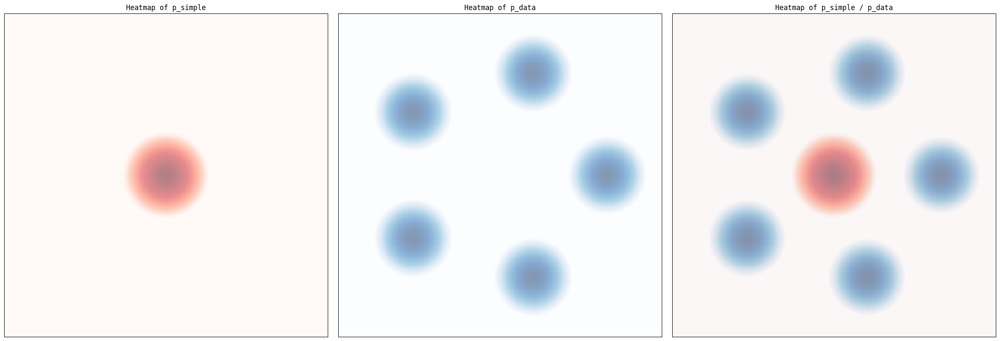

In [17]:
PARAMS = {"scale": 15.0,
          "target_scale": 10.0,
          "target_std": 1.0}

# Simple (noise) distribution: isotropic 2D Gaussian N(0, I)
p_simple = Gaussian.isotropic(dim = 2, std = 1.0).to(device)
# Target (data) distribution: 5 mode 2D Gaussian mixture, with each component
# having a variance of 1 and means evenly spaced on circle of radius 10
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"],
                                      scale = PARAMS["target_scale"]).to(device)

# Visualize the noise and data distributions
fig, axes = plt.subplots(1, 3, figsize = (24, 8))
bins = 200

scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

axes[0].set_title("Heatmap of p_simple")
axes[0].set_xticks([])
axes[0].set_yticks([])
imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = axes[0], vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))

axes[1].set_title("Heatmap of p_data")
axes[1].set_xticks([])
axes[1].set_yticks([])
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = axes[1], vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

axes[2].set_title("Heatmap of p_simple / p_data")
axes[2].set_xticks([])
axes[2].set_yticks([])
imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = axes[2], vmin = -10, alpha = 1.0, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = axes[2], vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

fig.tight_layout()

Let us now implement $\alpha_t$ and $\beta_t$ as objects fulfilling the interface contract $\alpha_1 = \beta_0 = 1$ and $\alpha_0 = \beta_1 = 0$, with computable time derivatives $\dot{\alpha}_t$ and $\dot{\beta}_t$.

In [18]:
class Alpha(ABC):
    def __init__(self):
        # Enforce boundary conditions: alpha(0) = 0, alpha(1) = 1. self(t) eval-
        # uates alpha(t) on batched tensor input t of shape (num_samples, 1).
        assert torch.allclose(self(torch.zeros(1, 1)), torch.zeros(1, 1))
        assert torch.allclose(self(torch.ones(1, 1)), torch.ones(1, 1))

    @abstractmethod
    def __call__(self, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate alpha(t) for continuous time t in [0, 1].

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute alpha(t).

        Returns
        -------
        alpha_t : torch.Tensor, shape (num_samples, 1)
            Computed alpha(t) values for each input time.
        """
        pass

    def dt(self, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the time derivative d/dt alpha(t).

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute alpha'(t).

        Returns
        -------
        dt : torch.Tensor, shape (num_samples, 1)
            alpha'(t) evaluated at the given time points.
        """
        # Expand t to shape (num_samples, 1, 1) so that each vmap slice has
        # shape (1, 1), matching the input shape expected by __call__.
        t = t.unsqueeze(1)
        # self(t) preserves shape: (1, 1). Each (1, 1) to (1, 1) map yields a
        # Jacobian of shape (1, 1, 1, 1) for each sample. vmap over the batch
        # dimension yields (num_samples, 1, 1, 1, 1).
        dt = vmap(jacrev(self))(t)
        # Flatten batched Jacobian to (num_samples, 1).
        return dt.view(-1, 1)

In [19]:
class Beta(ABC):
    def __init__(self):
        # Enforce boundary conditions: beta(0) = 1, beta(1) = 0.
        assert torch.allclose(self(torch.zeros(1, 1)), torch.ones(1, 1))
        assert torch.allclose(self(torch.ones(1, 1)), torch.zeros(1, 1))

    @abstractmethod
    def __call__(self, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate beta(t) for continuous time t in [0, 1].

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute beta(t).

        Returns
        -------
        beta_t : torch.Tensor, shape (num_samples, 1)
            Computed beta(t) values for each input time.
        """
        pass

    def dt(self, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the time derivative d/dt beta(t).

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute beta'(t).

        Returns
        -------
        dt : torch.Tensor, shape (num_samples, 1)
            beta'(t) evaluated at the given time points.
        """
        # Expand t to shape (num_samples, 1, 1) so that each vmap slice has shape
        # (1, 1), matching the input shape expected by __call__.
        t = t.unsqueeze(1)
        # Jacobian for each sample is of shape (1, 1, 1, 1), while vmap over the
        # batch dimension yields (num_samples, 1, 1, 1, 1).
        dt = vmap(jacrev(self))(t)
        # Flatten batched Jacobian to (num_samples, 1).
        return dt.view(-1, 1)

Let us now implement
$$
\begin{align*}
\alpha_t & = t\\
\beta_t & = \sqrt{1 - t}.
\end{align*}
$$
We observe that $\alpha_0 = \beta_1 = 0$, $\alpha_1 = \beta_0 = 1$, and that both are continuously differentiable, i.e.,
$$
\begin{align*}
\dot{\alpha}_t & = 1 \\
\dot{\beta}_t & = -\frac{1}{2\sqrt{1 - t}}.
\end{align*}
$$

In [20]:
class LinearAlpha(Alpha):
    """
    Linear alpha schedule defined by alpha(t) = t.
    """
    def __call__(self, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate alpha(t) for continuous time t in [0, 1].

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute alpha(t).

        Returns
        -------
        alpha_t : torch.Tensor, shape (num_samples, 1)
            Computed alpha(t) values for each input time.
        """
        return t.clone()

    def dt(self, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the time derivative d/dt alpha(t).

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute alpha'(t).

        Returns
        -------
        dt : torch.Tensor, shape (num_samples, 1)
            alpha'(t) evaluated at the given time points.
        """
        return torch.ones_like(t)

In [21]:
class SquareRootBeta(Beta):
    """
    Square-root decay beta schedule defined by beta(t) = sqrt(1 - t).
    """
    def __call__(self, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate beta(t) for continuous time t in [0, 1].

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute beta(t).

        Returns
        -------
        beta_t : torch.Tensor, shape (num_samples, 1)
            Computed beta(t) values for each input time.
        """
        beta_t = torch.sqrt(1 - t)
        return beta_t

    def dt(self, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the time derivative d/dt beta(t).

        Parameters
        ----------
        t : torch.Tensor, shape (num_samples, 1)
            Time values in [0, 1] for which to compute beta'(t).

        Returns
        -------
        dt : torch.Tensor, shape (num_samples, 1)
            beta'(t) evaluated at the given time points.
        """
        dt = -0.5 / (torch.sqrt(1 - t) + 1e-4)
        return dt

Let us now implement the Gaussian conditional probability path. As a reminder, it follows
$$
p_t(x\vert z) = \mathcal N\big(\alpha_t z, \beta_t^2I_d\big)
= \frac{1}{\left[2\pi\left(1 - t\right)\right]^{d/2}}\exp\left[-\frac{\left\lvert x - tz\right\rvert^2}{2\left(1 - t\right)}\right].
$$
Since $x = \alpha_tz + \beta_t\epsilon$ where $\epsilon\sim\mathcal N(0, I_d)$, the corresponding conditional Gaussian vector field can be obtained as follows.
$$
\begin{align*}
X_0 & \sim\epsilon \\
X_t & = \alpha_tz + \beta_t X_0 \\
\frac{\mathrm d}{\mathrm dt} X_t & = u_t^\mathrm{ref}\left(X_t\vert z\right) \\
& = \dot\alpha_tz + \dot\beta_tX_0 \\
& = \dot\alpha_tz + \dot\beta_t\left(\frac{x - \alpha_tz}{\beta_t}\right) \\
u_t^\mathrm{ref}\left(X_t\vert z\right) & = \left(\dot\alpha_t - \frac{\alpha_t\dot\beta_t}{\beta_t}\right)z + \frac{\dot\beta_t}{\beta_t}x
\end{align*}
$$
The conditional score function then follows
$$
\begin{align*}
\nabla\log p_t(x\vert z) & = \nabla\left[-\frac{d}{2}\log\left[2\pi\left(1 - t\right)\right] - \frac{\left\lvert x - tz\right\rvert^2}{2\left(1 - t\right)}\right] \\
& = -\frac{x - tz}{1 - t},
\end{align*}
$$
or $\displaystyle \frac{\alpha_tz - x}{\beta_t^2}$ in the general case.

In [22]:
class GaussianConditionalProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_data: Sampleable, alpha: Alpha, beta: Beta):
        """
        Initialize a Gaussian conditional probability path.

        Parameters
        ----------
        p_data : Sampleable
            Target data distribution.
        alpha : Alpha
            Mean schedule.
        beta : Beta
            Variance schedule.
        """
        # Initialize the noise distribution as N(0, I_d).
        p_simple = Gaussian.isotropic(p_data.dim, 1.0)
        super().__init__(p_simple, p_data)
        self.alpha = alpha
        self.beta = beta

    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        """
        Sample data examples z from the data distribution p_data(z).

        Parameters
        ----------
        num_samples : int
            Number of data examples to draw.

        Returns
        -------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        """
        return self.p_data.sample(num_samples)

    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Sample from the conditional probability path p_t(x|z) = N(alpha_t * z,
        beta_t^2 * I_d).

        Parameters
        ----------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated samples drawn from p_t(x|z), representing states along
            the conditional probability path at times t.
        """
        location = self.alpha(t) * z
        scale = self.beta(t) * torch.randn_like(z)
        x = location + scale
        return x

    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate the conditional Gaussian vector field u_t(x|z).

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated samples drawn from p_t(x|z), representing states along
            the conditional probability path.
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1) corresponding to each sample.

        Returns
        -------
        conditional_vector_field : torch.Tensor, shape (num_samples, dim)
            Values of the conditional vector field u_t(x|z).
        """
        z_term = (self.alpha.dt(t) - self.beta.dt(t) / self.beta(t) * self.alpha(t)) * z
        x_term = (self.beta.dt(t) / self.beta(t)) * x
        conditional_vector_field = z_term + x_term
        return conditional_vector_field

    def conditional_score(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate the conditional score nabla [ log p_t(x|z) ] for the Gaussian
        conditional probability path.

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated samples drawn from p_t(x|z), representing states along
            the conditional probability path.
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1) corresponding to each sample.

        Returns
        -------
        conditional_score : torch.Tensor, shape (num_samples, dim)
            Values of the conditional score function nabla [ log p_t(x|z) ].
        """
        conditional_score = (self.alpha(t) * z - x) / (self.beta(t) ** 2)
        return conditional_score

Let us now sample from and visualize the Gaussian conditional probability path.

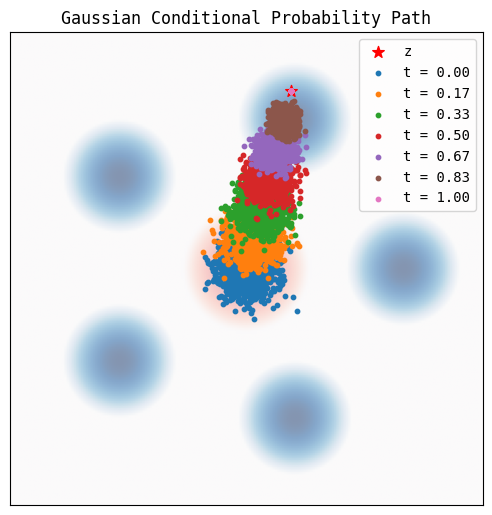

In [23]:
p_simple = Gaussian.isotropic(dim = 2, std = 1.0).to(device)
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)

# Construct Gaussian conditional probability path
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

plt.figure(figsize = (5.25, 5.25))
plt.xlim(*x_bounds)
plt.ylim(*y_bounds)
plt.title("Gaussian Conditional Probability Path")

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

# Sample the conditioning variable z to obtain a data point from the data distri-
# bution
z = path.sample_conditioning_variable(1)
plt.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 75, label = "z")
plt.xticks([])
plt.yticks([])

num_samples = 1000
ts = torch.linspace(0.0, 1.0, 7).to(device)
for t in ts:
    # Expand the conditioning variable and set of time points to match the num-
    # ber of samples that we will draw. Then, sample from the conditional pro-
    # bability path to obtain interpolated data samples.
    zz = z.expand(num_samples, 2)
    tt = t.unsqueeze(0).expand(num_samples, 1)
    samples = path.sample_conditional_path(zz, tt)
    plt.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), s = 10, label = f"t = {t.item():.2f}")

plt.legend(loc = "upper right")
plt.tight_layout()

We may visualize the trajectories corresponding to the ODE
$$
\mathrm dX_t = u_t\big(X_t\vert z\big)\,\mathrm dt, \, X_0 = x_0\sim p_\mathrm{simple},
$$
which describes the target velocity field regressed against by a flow model.

In [24]:
class ConditionalVectorFieldODE(ODE):
    def __init__(self, path: ConditionalProbabilityPath, z: torch.Tensor):
        """
        Initialize an ODE defined by a conditional vector field.

        Parameters
        ----------
        path : ConditionalProbabilityPath
            Conditional probability path corresponding to the conditional vector
            field.
        z : torch.Tensor, shape (1, dim)
            Single sample drawn from the data distribution p_data(z), used as the
            conditioning variable.
        """
        super().__init__()
        self.path = path
        self.z = z

    def drift_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Returns the conditional vector field u_t(x|z) defining the flow ODE.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        conditional_vector_field : torch.Tensor, shape (batch_size, dim)
            Conditional vector field u_t(x|z) for each sample and time step.
        """
        bs = x.shape[0]
        # Broadcast z to shape (batch_size, dim)
        z = self.z.expand(bs, *self.z.shape[1:])
        return self.path.conditional_vector_field(x, z, t)

100%|██████████| 999/999 [00:00<00:00, 2659.29it/s]


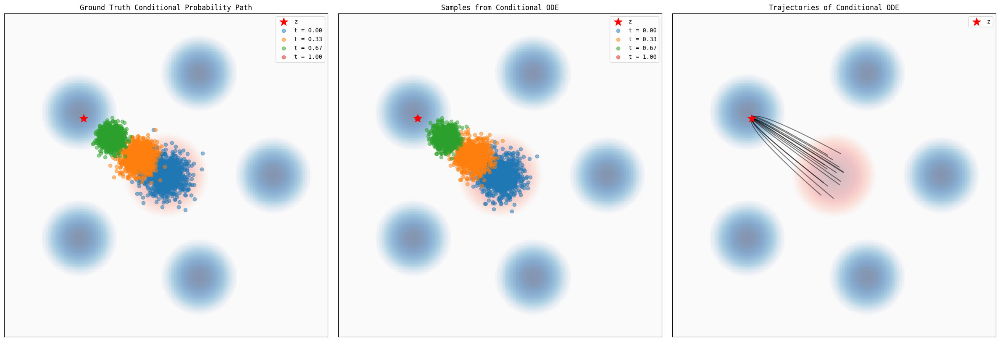

In [25]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 3

p_simple = Gaussian.isotropic(dim = 2, std = 1.0).to(device)
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)

# Construct Gaussian conditional probability path
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

fig, axes = plt.subplots(1, 3, figsize = (24, 8))
scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

torch.cuda.manual_seed(1)
z = path.sample_conditioning_variable(1)

# Samples from the conditional ODE
ax = axes[1]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Samples from Conditional ODE")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

ode = ConditionalVectorFieldODE(path, z)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).view(1, -1, 1).expand(num_samples, -1, 1).to(device)
xts = simulator.simulate_with_trajectory(x0, ts)

every_n = record_every(num_timesteps = num_timesteps, record_every = num_timesteps // num_marginals)
xts_every_n = xts[:, every_n, :]
ts_every_n = ts[0, every_n]
for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].item()
    ax.scatter(xts_every_n[:, plot_idx, 0].detach().cpu(),
               xts_every_n[:, plot_idx, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt:.2f}")
ax.legend(loc = "upper right")

# Trajectories of the conditional ODE
ax = axes[2]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Trajectories of Conditional ODE")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

for traj_idx in range(15):
    ax.plot(xts[traj_idx, :, 0].detach().cpu(),
            xts[traj_idx, :, 1].detach().cpu(),
            alpha = 0.5, color = "black")
ax.legend(loc = "upper right")

# Ground truth conditional probability path
ax = axes[0]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Ground Truth Conditional Probability Path")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].unsqueeze(0).expand(num_samples, 1)
    zz = z.expand(num_samples, 2)
    marginal_samples = path.sample_conditional_path(zz, tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(),
               marginal_samples[:, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt[0,0].item():.2f}")

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))
ax.legend(loc = "upper right")

fig.tight_layout()

By adding Langevin dynamics to the ODE $\mathrm dX_t = u_t\big(X_t\vert z\big)\,\mathrm dt$, we construct an SDE that follows the same probability path, i.e.,
$$
\begin{align*}
\mathrm dX_t & = u_t\big(X_t\vert z\big)\,\mathrm dt
+ \left[\frac{\sigma^2_t}{2}\nabla\log p_t\big(X_t\vert z\big)\,\mathrm dt + \sigma_t\,\mathrm dW_t \right] \\
& = \left[u_t\big(X_t\vert z\big) + \frac{\sigma^2_t}{2}\nabla\log p_t\big(X_t\vert z\big)\right]\mathrm dt + \sigma_t\,\mathrm dW_t, \\
X_0 & = x_0 \sim p_\mathrm{simple}.
\end{align*}
$$
Let us visualize the conditional trajectories corresponding to this SDE.

In [26]:
class ConditionalVectorFieldSDE(SDE):
    def __init__(self, path: ConditionalProbabilityPath, z: torch.Tensor, sigma: float):
        """
        Initialize an SDE following a conditional probability path.

        Parameters
        ----------
        path : ConditionalProbabilityPath
            Conditional probability path defining a conditional vector field and
            score function.
        z : torch.Tensor, shape (1, dim)
            Single sample drawn from the data distribution p_data(z), used as the
            conditioning variable.
        sigma : float
            Scalar diffusion coefficient controlling noise strength.
        """
        super().__init__()
        self.path = path
        self.z = z
        self.sigma = sigma

    def drift_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Return the drift coefficient of the SDE, as a function of the conditional
        vector field and score function.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        drift_coefficient : torch.Tensor, shape (batch_size, dim)
            Drift coefficients evaluated at the given states and times.
        """
        bs = x.shape[0]
        z = self.z.expand(bs, *self.z.shape[1:])
        drift_term = self.path.conditional_vector_field(x, z, t)
        score_term = 0.5 * self.sigma ** 2 * self.path.conditional_score(x, z, t)
        return drift_term + score_term

    def diffusion_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Return the diffusion coefficient of the SDE, evaluated at the given times.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        diffusion_coefficient : torch.Tensor, shape (batch_size, dim)
            Diffusion coefficients evaluated at the given times.
        """
        return self.sigma * torch.ones_like(x)

Note that for the Gaussian conditional probability path, the SDE follows
$$
\begin{align*}
\mathrm dX_t & = \left[u_t\big(X_t\vert z\big) + \frac{\sigma_t^2}{2}\left(\frac{\alpha_tz - X_t}{\beta_t^2}\right)\right]\mathrm dt + \sigma_t\,\mathrm dW_t.
\end{align*}
$$
However, $\beta_t\rightarrow 0$ as $t\rightarrow 1$, such that the score term diverges as $\frac{1}{\beta_t^2}$. In practice, this is resolved by setting $\sigma_t = \beta_t$, yielding the stable SDE
$$
\mathrm dX_t = \left[u_t\big(X_t\vert z\big) + \frac{\alpha_tz - X_t}{2}\right]\mathrm dt + \beta_t\,\mathrm dW_t,
$$
where the divergence is compensated for by a gradually decreasing noise level.

100%|██████████| 999/999 [00:00<00:00, 1799.06it/s]


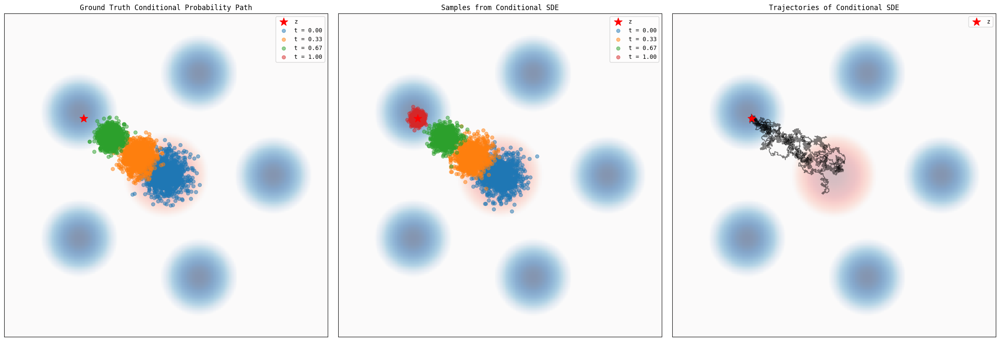

In [27]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 3
sigma = 2.5

p_simple = Gaussian.isotropic(dim = 2, std = 1.0).to(device)
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

fig, axes = plt.subplots(1, 3, figsize = (24, 8))
scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

torch.cuda.manual_seed(1)
z = path.sample_conditioning_variable(1)

# Samples from the conditional SDE
ax = axes[1]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Samples from Conditional SDE")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

sde = ConditionalVectorFieldSDE(path, z, sigma)
simulator = EulerMaruyamaSimulator(sde)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).view(1, -1, 1).expand(num_samples, -1, 1).to(device)
xts = simulator.simulate_with_trajectory(x0, ts)

every_n = record_every(num_timesteps = num_timesteps, record_every = num_timesteps // num_marginals)
xts_every_n = xts[:, every_n, :]
ts_every_n = ts[0, every_n]
for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].item()
    ax.scatter(xts_every_n[:, plot_idx, 0].detach().cpu(),
               xts_every_n[:, plot_idx, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt:.2f}")
ax.legend(loc = "upper right")

# Trajectories of the conditional SDE
ax = axes[2]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Trajectories of Conditional SDE")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

for traj_idx in range(5):
    ax.plot(xts[traj_idx, :, 0].detach().cpu(), xts[traj_idx, :, 1].detach().cpu(), alpha = 0.5, color = "black")
ax.legend(loc = "upper right")

# Ground truth conditional probability path
ax = axes[0]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Ground Truth Conditional Probability Path")
ax.scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)

for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].unsqueeze(0).expand(num_samples, 1)
    zz = z.expand(num_samples, 2)
    marginal_samples = path.sample_conditional_path(zz, tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(), marginal_samples[:, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt[0, 0].item():.2f}")

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))
ax.legend(loc = "upper right")

fig.tight_layout()

## Flow Matching and Score Matching

The goal of flow matching is to learn the marginal vector field $u_t(x)$, given by
$$
u_t^\mathrm{ref}(x) = \operatorname{E}_{z\sim p_t(z\vert x)}\left[u_t^\mathrm{ref}(x\vert z)\right]
= \int\mathrm dz \; u_t^\mathrm{ref}(x\vert z)\,p_t(z\vert x).
$$
However, it is difficult to compute $u_t^\mathrm{ref}(x)$ because $\int\mathrm dz\;p_t(x\vert z)\,p_\mathrm{data}(z)$ is intractable. Therefore, we approximate $u_t^\mathrm{ref}(x)$ as a neural network $u_t^\theta(x)$ using the _conditional_ flow matching objective
$$
\begin{align*}
\mathcal L_\mathrm{CFM}(\theta) = \operatorname{E}_{z\sim p_\mathrm{data}(z),\,x\sim p_t(x\vert z)}\left[\left\lvert u_t^\theta(x) - u_t^\mathrm{ref}(x\vert z)\right\rvert^2\right],
\end{align*}
$$
which regresses against the _conditional_ vector field. We will use a multilayer perceptron (series of fully connected layers, with nonlinear activations) for this purpose.

In [28]:
def build_mlp(dims: List[int], activation: Type[torch.nn.Module] = torch.nn.SiLU):
    """
    Build a multi-layer perceptron composed of linear layers, with activation
    functions applied to the hidden layers. The default activation function is
    is SiLU (sigmoid linear unit), i.e., x / [1 + exp(-x)].

    Parameters
    ----------
    dims : List[int]
        Dimensions of the network, i.e., number of units at each layer.
    activation : torch.nn.Module
        Activation function to be applied to the hidden layers. Defaults to SiLU.

    Returns
    -------
    torch.nn.Sequential
        Sequential model constructed from a list of linear layers and activation
        functions.
    """
    # Create a list of layers and activation functions that will be used to cons-
    # truct a Sequential model.
    mlp = []
    # Iterate over the dimensions of the network. The input layer has dims[0] u-
    # nits, while the output layer has dims[-1] units.
    for idx in range(len(dims) - 1):
        # Add linear layers, where each layer connects (input, output) features
        # ranging from (0, 1), ..., (n - 2, n - 1), where n is the length of the
        # list.
        mlp.append(torch.nn.Linear(dims[idx], dims[idx + 1]))
        # Add an activation function after each hidden layer, i.e., up to (n -
        # 3, n - 2), but not after the final output layer (n - 2, n - 1). This
        # ensures that only the hidden layers have non-linearity.
        if idx < len(dims) - 2:
            mlp.append(activation())
    # Construct a Sequential model from the list of modules (layers and activa-
    # tion functions).
    return torch.nn.Sequential(*mlp)

In [29]:
class MLPVectorField(torch.nn.Module):
    """
    Construct a multi-layer perceptron (MLP) to parameterize the learned vector
    field u_t^theta in flow matching.
    """
    def __init__(self, dim: int, hiddens: List[int]):
        """
        Initialize the MLP to approximate the conditional vector field u_t(x|z)
        in flow matching.

        Parameters
        ----------
        dim : int
            Number of dimensions in each data sample.
        hiddens : List[int]
            Number of units in each hidden layer of the MLP.
        """
        super().__init__()
        self.dim = dim
        # Add a final dimension corresponding to the time point for each sample
        # to the input layer, then build the MLP.
        self.net = build_mlp([dim + 1] + hiddens + [dim])

    def forward(self, x: torch.Tensor, t: torch.Tensor):
        """
        Perform a forward pass through the MLP.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        torch.Tensor, shape (batch_size, dim)
            Neural network approximation u_t^theta(x) to the conditional vector
            field u_t(x|z).
        """
        # Concatenate the time point for each sample as dim + 1.
        xt = torch.cat([x, t], dim = -1)
        # Perform a forward pass through MLP, and return the neural network a-
        # pproximation to the conditional vector field.
        return self.net(xt)

In [30]:
class Trainer(ABC):
    def __init__(self, model: torch.nn.Module):
        super().__init__()
        self.model = model

    @abstractmethod
    def get_train_loss(self, **kwargs) -> torch.Tensor:
        pass

    def get_optimizer(self, lr: float):
        """
        Return an Adam optimizer for the model with the given learning rate.
        """
        return torch.optim.Adam(self.model.parameters(), lr = lr)

    def train(self, num_epochs: int, device: torch.device, lr: float = 1e-3, **kwargs) -> torch.Tensor:
        """
        Train the model for the specified number of epochs with the given lear-
        ning rate.
        """
        # Move the model to the GPU if available, retrieve the optimizer, and
        # set the model to training mode (note that this must be done before
        # starting the training loop).
        self.model.to(device)
        opt = self.get_optimizer(lr)
        self.model.train()

        # For each training epoch, reset the gradients to zero, compute the
        # training loss, and take its gradient with respect to the each weight
        # or bias (stored in their respective .grad attributes). Update model
        # parameters using the gradients.
        pbar = tqdm(enumerate(range(num_epochs)))
        for idx, epoch in pbar:
            opt.zero_grad()
            loss = self.get_train_loss(**kwargs)
            loss.backward()
            opt.step()
            pbar.set_description_str(f"Epoch {idx}, Loss: {loss.item()}")

        # Set the model to evaluation mode for validation, testing, or inference
        self.model.eval()

Let us compute the conditional flow matching loss
$$
\begin{align*}
\mathcal L_\mathrm{CFM}(\theta) & = \operatorname{E}_{z\sim p_\mathrm{data},\,t\sim\mathcal{U}[0, 1),\,x\sim p_t(\cdot\vert z)}\left[\left\lvert u_t^\theta(x) - u_t^\mathrm{ref}(x\vert z)\right\rvert^2\right]
\end{align*}
$$
using a Monte-Carlo (random sampling) estimate of the form
$$
\begin{gather*}
\frac{1}{N}\sum_{i = 1}^N\left\lvert u_{t_i}^\theta(x_i) - u_{t_i}^\mathrm{ref}(x_i\vert z_i)\right\rvert^2 \\
i\in\left[1, \dots, N\right] \\
z_i\sim p_\mathrm{data}, t_i\sim\mathcal{U}[0, 1), x_i\sim p_t(\cdot\vert z_i)
\end{gather*}
$$
where $N$ is the _batch_ size. Once we have trained the neural network $u_t^\theta(x)$, we may then visualize how well it approximates the marginal vector field $u_t^\mathrm{ref}(x)$, i.e., whether it drives samples from $p_\mathrm{init}$ to $p_\mathrm{data}$.

In [31]:
class ConditionalFlowMatchingTrainer(Trainer):
    def __init__(self, path: ConditionalProbabilityPath, model: MLPVectorField, **kwargs):
        super().__init__(model, **kwargs)
        self.path = path

    def get_train_loss(self, batch_size: int) -> torch.Tensor:
        """
        Compute the conditional flow matching loss using random sampling.
        """
        z = self.path.p_data.sample(batch_size)
        t = torch.rand(batch_size, 1, device = device)
        x = self.path.sample_conditional_path(z, t)

        u_t_ref = self.path.conditional_vector_field(x, z, t)
        # Calls the forward method of MLPVectorField.
        u_t_theta = self.model(x, t)
        squared_errors = torch.sum(torch.square(u_t_theta - u_t_ref), dim = 1)
        loss = torch.mean(squared_errors)
        return loss

In [32]:
class LearnedVectorFieldODE(ODE):
    def __init__(self, net: MLPVectorField):
        """
        ODE whose drift (vector field) is parameterized by a neural network.
        """
        self.net = net

    def drift_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluate the drift (vector field) of the ODE at the given states and
        times.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Time associated with each sample in the batch.

        Returns
        -------
        torch.Tensor, shape (batch_size, dim)
            Drift coefficients u_t^theta(x) evaluated at the given times.
        """
        return self.net(x, t)

In [33]:
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

# Construct a MLP with 3, 64, 64, 64, 64, and 2 units to approximate the condi-
# tional vector field u_t(x|z) with the neural network u_t^theta(x)
flow_model = MLPVectorField(dim = 2, hiddens = [64, 64, 64, 64])

# Train the model for 5000 epochs, with a learning rate of 10^-3 and batch size
# of 1000
trainer = ConditionalFlowMatchingTrainer(path, flow_model)
losses = trainer.train(num_epochs = 5000, device = device, lr = 1e-3, batch_size = 1000)

Epoch 4999, Loss: 20.466732025146484: 5000it [00:31, 156.73it/s]


100%|██████████| 999/999 [00:00<00:00, 2302.52it/s]


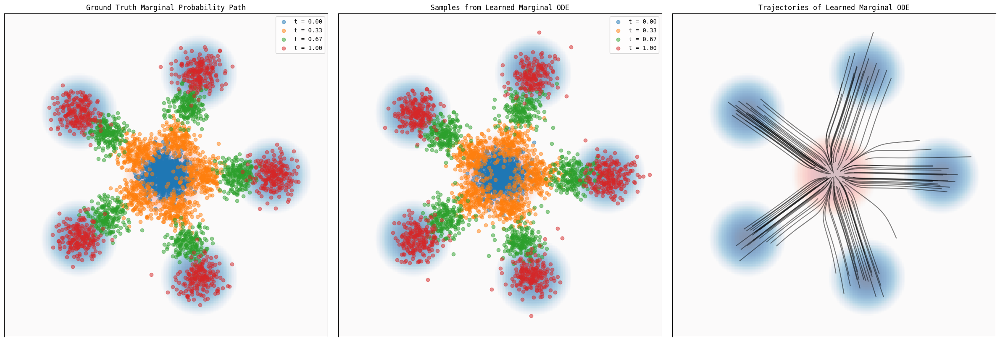

In [34]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 3

fig, axes = plt.subplots(1, 3, figsize = (24, 8))

scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

# Samples from the learned marginal ODE
ax = axes[1]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Samples from Learned Marginal ODE")

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

ode = LearnedVectorFieldODE(flow_model)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).view(1, -1, 1).expand(num_samples, -1, 1).to(device)
xts = simulator.simulate_with_trajectory(x0, ts)

every_n = record_every(num_timesteps = num_timesteps, record_every = num_timesteps // num_marginals)
xts_every_n = xts[:, every_n, :]
ts_every_n = ts[0, every_n]
for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].item()
    ax.scatter(xts_every_n[:, plot_idx, 0].detach().cpu(),
               xts_every_n[:, plot_idx, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt:.2f}")
ax.legend(loc = "upper right")

# Trajectories of learned marginal ODE
ax = axes[2]
ax.set_title("Trajectories of Learned Marginal ODE")
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

for traj_idx in range(num_samples // 10):
    ax.plot(xts[traj_idx, :, 0].detach().cpu(), xts[traj_idx, :, 1].detach().cpu(), alpha = 0.5, color = "black")

# Ground truth marginal probability path
ax = axes[0]
ax.set_title("Ground Truth Marginal Probability Path")
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])

for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].unsqueeze(0).expand(num_samples, 1)
    marginal_samples = path.sample_marginal_path(tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(),
               marginal_samples[:, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt[0, 0].item():.2f}")

imshow_density(density = p_simple, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = p_data, x_bounds = x_bounds, y_bounds = y_bounds, bins = 200,
               ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))
ax.legend(loc = "upper right")

fig.tight_layout()

Score matching trains a neural network $u_t^\theta(x)\approx u_t^\mathrm{ref}(x)$ such that the ODE
$$
\mathrm dX_t = u_t^\theta(X_t)\,\mathrm dt
$$
passes through the desired marginal probability path $p_t(x)$. Augmenting the reference marginal vector field $u_t^\mathrm{ref}(x)$ with Langevin dynamics adds stochasticity while preserving the marginal probability path, i.e.,
$$
\begin{align*}
\mathrm dX_t & = \left[u_t^\mathrm{ref}(x) + \frac{\sigma^2}{2}\nabla\log p_t(x)\right]\mathrm dt + \sigma\,\mathrm dW_t \\
& \approx\left[u_t^\theta(x) + \frac{\sigma^2}{2}\nabla\log p_t(x)\right]\mathrm dt + \sigma\,\mathrm dW_t.
\end{align*}
$$
How do we compute the marginal score $\nabla\log p_t(x)$? We had previously computed the _conditional_ score $\nabla\log p_t(x\vert z)$ of the Gaussian probability path. By using a score network $s_t^\theta(x)$ to approximate $\nabla\log p_t(x)$, where
$$
\begin{align*}
\nabla\log p_t(x) & = \int\mathrm dz\, p_t(z\vert x) \nabla\log p_t(x\vert z) \\
& = \operatorname{E}_{z\sim p_t(z\vert x)}\left[\nabla\log p_t(x\vert z)\right],
\end{align*}
$$
we may obtain the conditional score matching loss
$$
\begin{align*}
\mathcal L_\mathrm{CSM}(\theta) & = \operatorname{E}_{z\sim p_\mathrm{data},\,t\sim\mathcal{U}[0, 1),\,x\sim p_t(\cdot\vert z)}\left[\left\lvert s_t^\theta(x) - \nabla\log p_t(x\vert z)\right\rvert^2\right].
\end{align*}
$$

In [35]:
class MLPScore(torch.nn.Module):
    """
    Construct a multi-layer perceptron (MLP) to parameterize the learned score
    function s_t^theta in score matching.
    """
    def __init__(self, dim: int, hiddens: List[int]):
        """
        Initialize the MLP to approximate the conditional score function nabla
        [ log p_t(x|z) ].

        Parameters
        ----------
        dim : int
            Number of dimensions in each data sample.
        hiddens : List[int]
            Number of units in each hidden layer of the MLP.
        """
        super().__init__()
        self.dim = dim
        # Add a final dimension corresponding to the time point for each sample
        # to the input layer, then build the MLP.
        self.net = build_mlp([dim + 1] + hiddens + [dim])

    def forward(self, x: torch.Tensor, t: torch.Tensor):
        """
        Perform a forward pass through the MLP.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        torch.Tensor, shape (batch_size, dim)
            Neural network approximation s_t^theta(x) to the conditional score
            function nabla [ log p_t(x|z) ].
        """
        # Concatenate the time point for each sample as dim + 1.
        xt = torch.cat([x, t], dim = -1)
        # Perform a forward pass through MLP, and return the neural network a-
        # pproximation to the conditional score function.
        return self.net(xt)

In [36]:
class ConditionalScoreMatchingTrainer(Trainer):
    def __init__(self, path: ConditionalProbabilityPath, model: MLPScore, **kwargs):
        super().__init__(model, **kwargs)
        self.path = path

    def get_train_loss(self, batch_size: int) -> torch.Tensor:
        """
        Compute the conditional score matching loss using random sampling.
        """
        z = self.path.p_data.sample(batch_size)
        t = torch.rand(batch_size, 1, device = device)
        x = self.path.sample_conditional_path(z, t)

        conditional_score = self.path.conditional_score(x, z, t)
        # Calls the forward method of MLPScore.
        s_t_theta = self.model(x, t)
        squared_errors = torch.sum(torch.square(s_t_theta - conditional_score), dim = 1)
        loss = torch.mean(squared_errors)
        return loss

In [37]:
p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

# Construct a MLP with 3, 64, 64, 64, 64, and 2 units to approximate the
# conditional score function nabla [ log p_t(x|z) ] with the neural net-
# work s_t^theta(x)
score_model = MLPScore(dim = 2, hiddens = [64, 64, 64, 64])

# Train the model for 1000 epochs, with a learning rate of 10^-3 and batch size
# of 1000
trainer = ConditionalScoreMatchingTrainer(path, score_model)
losses = trainer.train(num_epochs = 1000, device = device, lr = 1e-3, batch_size = 1000)

Epoch 999, Loss: 11.624128341674805: 1000it [00:04, 225.14it/s]


Rather than using a `EulerSimulator` to integrate the learned vector field as an `ODE`, we will wrap the learned flow and score models in an instance of `SDE` so that it can be integrated using a `EulerMaruyamaSimulator`. The dynamics of the SDE then follows
$$
\mathrm dX_t = \left[u_t^\theta(x) + \frac{\sigma^2}{2}s_t^\theta(x)\right]\mathrm dt + \sigma\,\mathrm dW_t.
$$

In [38]:
class LangevinFlowSDE(SDE):
    def __init__(self, flow_model: MLPVectorField, score_model: MLPScore, sigma: float):
        """
        SDE whose drift (vector field and score function) and diffusion (noise
        strength) are parameterized by a neural network.
        """
        super().__init__()
        self.flow_model = flow_model
        self.score_model = score_model
        self.sigma = sigma

    def drift_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Return the drift coefficient of the SDE, as a function of the vector
        field and score function.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current states x_t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Time associated with each sample in the batch.

        Returns
        -------
        drift_coefficient : torch.Tensor, shape (batch_size, dim)
            Drift coefficients evaluated at the given states and times.
        """
        drift_term = self.flow_model(x, t)
        score_term = 0.5 * self.sigma ** 2 * self.score_model(x, t)
        return drift_term + score_term

    def diffusion_coefficient(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Return the diffusion coefficient of the SDE, evaluated at the given times.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        diffusion_coefficient : torch.Tensor, shape (batch_size, dim)
            Diffusion coefficients evaluated at the given times.
        """
        return self.sigma * torch.ones_like(x)

100%|██████████| 299/299 [00:00<00:00, 1420.88it/s]


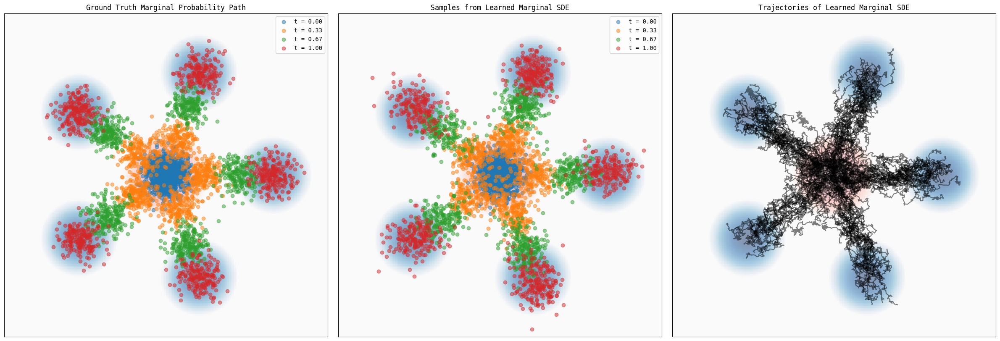

In [39]:
num_samples = 1000
num_timesteps = 300
num_marginals = 3
sigma = 2.0

scale = PARAMS["scale"]
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

fig, axes = plt.subplots(1, 3, figsize = (24, 8))

# Samples from the learned marginal SDE
ax = axes[1]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Samples from Learned Marginal SDE")

imshow_density(density = path.p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = path.p_data, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

sde = LangevinFlowSDE(flow_model, score_model, sigma)
simulator = EulerMaruyamaSimulator(sde)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).view(1, -1, 1).expand(num_samples, -1, 1).to(device)
xts = simulator.simulate_with_trajectory(x0, ts)

every_n = record_every(num_timesteps = num_timesteps, record_every = num_timesteps // num_marginals)
xts_every_n = xts[:, every_n, :]
ts_every_n = ts[0, every_n]
for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].item()
    ax.scatter(xts_every_n[:, plot_idx, 0].detach().cpu(),
               xts_every_n[:, plot_idx, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt:.2f}")

ax.legend(loc = "upper right")

# Trajectories of the learned marginal SDE
ax = axes[2]
ax.set_title("Trajectories of Learned Marginal SDE")
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])

imshow_density(density = path.p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = path.p_data, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

for traj_idx in range(num_samples // 10):
    ax.plot(xts[traj_idx, :, 0].detach().cpu(), xts[traj_idx, :, 1].detach().cpu(), alpha = 0.5, color = "black")

# Ground truth marginal probability path
ax = axes[0]
ax.set_title("Ground Truth Marginal Probability Path")
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks([])
ax.set_yticks([])

for plot_idx in range(xts_every_n.shape[1]):
    tt = ts_every_n[plot_idx].unsqueeze(0).expand(num_samples, 1)
    marginal_samples = path.sample_marginal_path(tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(),
               marginal_samples[:, 1].detach().cpu(),
               marker = "o", alpha = 0.5, label = f"t = {tt[0, 0].item():.2f}")

imshow_density(density = path.p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
imshow_density(density = path.p_data, x_bounds = x_bounds, y_bounds = y_bounds,
               bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))
ax.legend(loc = "upper right")

fig.tight_layout()

The marginal vector field for Gaussian probability path $p_t(x\vert z) = \mathcal N\big(x; \alpha_tz, \beta_t^2I_d\big)$ can be derived as follows.
$$
\begin{align*}
u_t^\mathrm{ref}\left(x\vert z\right) & = \left(\dot\alpha_t - \frac{\alpha_t\dot\beta_t}{\beta_t}\right)z + \frac{\dot\beta_t}{\beta_t}x \\
& = \left(\dot\alpha_t - \frac{\alpha_t\dot\beta_t}{\beta_t}\right)\frac{\beta^2_t}{\alpha_t}\frac{\alpha_t z}{\beta^2_t}
+ \left(\frac{\dot\beta_t}{\beta_t} - \frac{\dot\alpha_t}{\alpha_t} + \frac{\dot\alpha_t}{\alpha_t}\right)x \\
& = \left(\frac{\dot\alpha_t\beta^2_t}{\alpha_t} - \beta_t\dot\beta_t\right)\frac{\alpha_t z}{\beta^2_t}
+ \frac{\dot\alpha_t}{\alpha_t}x
- \beta_t^2\left(\frac{\dot\alpha_t}{\alpha_t} - \frac{\dot\beta_t}{\beta_t}\right)\frac{x}{\beta_t^2} \\
& = \left(\frac{\dot\alpha_t\beta^2_t}{\alpha_t} - \beta_t\dot\beta_t\right)\frac{\alpha_t z}{\beta^2_t}
+ \frac{\dot\alpha_t}{\alpha_t}x
- \left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)\frac{x}{\beta_t^2} \\
& = \left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)\left(\frac{\alpha_t z}{\beta^2_t} - \frac{x}{\beta_t^2}\right)
+ \frac{\dot\alpha_t}{\alpha_t}x \\
& = \left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)\nabla\log p_t(x\vert z)
+ \frac{\dot\alpha_t}{\alpha_t}x
\end{align*}
$$

Marginalizing over data points $z$ yields the marginal flow vector field.
$$
\begin{align*}
u^\mathrm{ref}(x) & = \int\mathrm dz\;u_t^\mathrm{ref}\big(x\vert z\big)
\frac{p_t(x\vert z)p_\mathrm{data}(z)}{p_t(x)} \\
& = \int\mathrm dz\;\frac{p_t(x\vert z)p_\mathrm{data}(z)}{p_t(x)}
\left[\left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)\nabla\log p_t(x\vert z) + \frac{\dot\alpha_t}{\alpha_t}x\right] \\
& = \left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)\nabla\log p_t(x) + \frac{\dot\alpha_t}{\alpha_t}x
\end{align*}
$$

Rearranging yields an expression for the marginal score.
$$
\begin{align*}
\nabla\log p_t(x) & = \frac{u_t^\mathrm{ref}(x) - \frac{\dot\alpha_t}{\alpha_t}x}{\left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)}
\end{align*}
$$

Since we have already trained a vector field network $u_t^\theta(x)$, we may parameterize the corresponding score network $s_t^\theta(x)$ as
$$
\begin{align*}
\tilde s_t^\theta(x) & = \frac{u_t^\theta(x) - \frac{\dot\alpha_t}{\alpha_t}x}{\left(\frac{\beta_t^2\dot\alpha_t}{\alpha_t} - \beta_t\dot\beta_t\right)}
= \frac{\alpha_tu_t^\theta(x) - \dot\alpha_t x}{\beta_t^2\dot\alpha_t - \alpha_t\beta_t\dot\beta_t},
\end{align*}
$$
allowing us to compute one given the other. For
$$
\begin{align*}
\alpha_t = t & \rightarrow\dot\alpha_t = 1 \\
\beta_t = \sqrt{1 - t} &\rightarrow\dot\beta_t = -\frac{1}{2\sqrt{1 - t}},
\end{align*}
$$
we obtain
$$
\begin{align*}
\beta_t^2\dot\alpha_t - \alpha_t\beta_t\dot\beta_t
& = (1 - t) + \frac{t\sqrt{1 - t}}{2\sqrt{1 - t}}.
\end{align*}
$$
For $t\in [0, 1)$, this expression simplifies to $1 - \frac{t}{2}$, approaching $\frac{1}{2}$ at $t\rightarrow 1$. In practice, we take the final time point to be $t = 1 - \epsilon$ for small $\epsilon\approx 0$.

Let us now compare the flow-parameterized score $\tilde s^\theta_t(x)$ (from the learned vector field) to that trained independently via conditional score matching $s_t^\theta(x)$.

In [40]:
class ScoreFromVectorField(torch.nn.Module):
    """
    Parameterize the score given a learned vector field u_t^theta(x), for the
    case of a Gaussian conditional probability path.
    """
    def __init__(self, vector_field: MLPVectorField, alpha: Alpha, beta: Beta):
        super().__init__()
        self.vector_field = vector_field
        self.alpha = alpha
        self.beta = beta

    def forward(self, x: torch.Tensor, t: torch.Tensor):
        """
        Perform a forward pass through the neural network.

        Parameters
        ----------
        x : torch.Tensor, shape (batch_size, dim)
            Current state at time t for each sample in the batch.
        t : torch.Tensor, shape (batch_size, 1)
            Current time for each sample in the batch.

        Returns
        -------
        score : torch.Tensor, shape (batch_size, dim)
            Neural network approximation s_t^theta(x) of the marginal score.
        """
        u_t_theta = self.vector_field(x, t)
        numerator = self.alpha(t) * u_t_theta - self.alpha.dt(t) * x
        denominator = self.alpha.dt(t) * (self.beta(t) ** 2) - self.alpha(t) * self.beta(t) * self.beta.dt(t)

        score = numerator / denominator
        return score

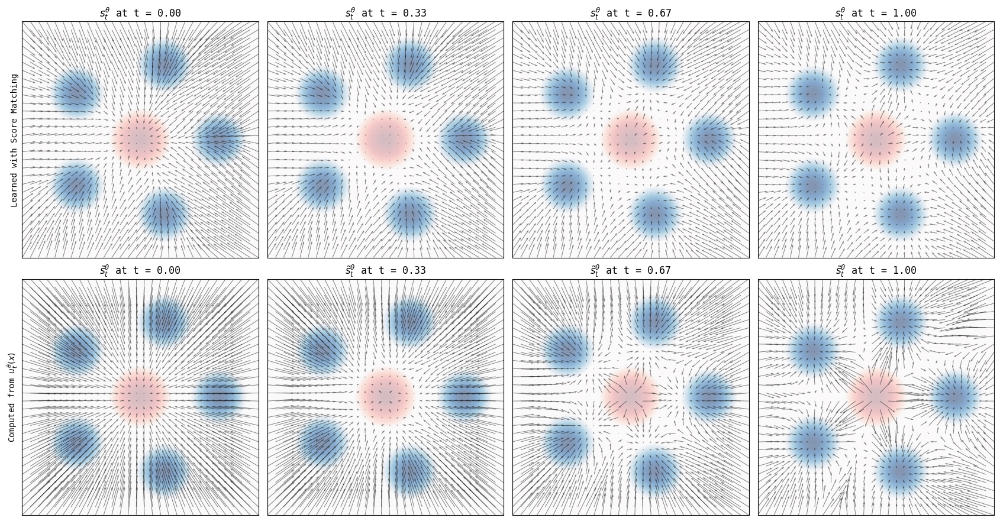

In [41]:
num_bins = 30
num_marginals = 4

p_data = GaussianMixture.symmetric_2D(nmodes = 5, std = PARAMS["target_std"], scale = PARAMS["target_scale"]).to(device)
path = GaussianConditionalProbabilityPath(p_data = p_data,
                                          alpha = LinearAlpha(),
                                          beta = SquareRootBeta()).to(device)

learned_score_model = score_model
flow_score_model = ScoreFromVectorField(flow_model, path.alpha, path.beta)

fig, axes = plt.subplots(2, num_marginals, figsize = (4.25 * num_marginals, 9))
axes = axes.reshape((2, num_marginals))

scale = PARAMS["scale"]
ts = torch.linspace(0.0, 0.9999, num_marginals).to(device)
xs = torch.linspace(-scale, scale, num_bins).to(device)
ys = torch.linspace(-scale, scale, num_bins).to(device)
xx, yy = torch.meshgrid(xs, ys, indexing = "ij")
xx = xx.reshape(-1, 1)
yy = yy.reshape(-1, 1)
xy = torch.cat([xx, yy], dim = -1)

axes[0, 0].set_ylabel("Learned with Score Matching")
axes[1, 0].set_ylabel("Computed from $u_t^{{\\theta}}(x)$")
for idx in range(num_marginals):
    t = ts[idx]
    bs = num_bins ** 2
    tt = t.view(1, 1).expand(bs, 1)

    # Scores from score matching
    learned_scores = learned_score_model(xy, tt)
    learned_scores_x = learned_scores[:, 0]
    learned_scores_y = learned_scores[:, 1]

    ax = axes[0, idx]
    ax.quiver(xx.detach().cpu(), yy.detach().cpu(),
              learned_scores_x.detach().cpu(), learned_scores_y.detach().cpu(),
              scale = 125, alpha = 0.5)

    imshow_density(density = path.p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
                   bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
    imshow_density(density = path.p_data, x_bounds = x_bounds, y_bounds = y_bounds,
                   bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

    ax.set_title(f"$s_{{t}}^{{\\theta}}$ at t = {t.item():.2f}")
    ax.set_xticks([])
    ax.set_yticks([])

    # Scores from learned vector field
    ax = axes
    flow_scores = flow_score_model(xy, tt)
    flow_scores_x = flow_scores[:, 0]
    flow_scores_y = flow_scores[:, 1]

    ax = axes[1, idx]
    ax.quiver(xx.detach().cpu(), yy.detach().cpu(),
              flow_scores_x.detach().cpu(), flow_scores_y.detach().cpu(),
              scale = 125, alpha = 0.5)

    imshow_density(density = path.p_simple, x_bounds = x_bounds, y_bounds = y_bounds,
                   bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Reds"))
    imshow_density(density = path.p_data, x_bounds = x_bounds, y_bounds = y_bounds,
                   bins = 200, ax = ax, vmin = -10, alpha = 0.5, cmap = plt.get_cmap("Blues"))

    ax.set_title(f"$\\tilde{{s}}_{{t}}^{{\\theta}}$ at t = {t.item():.2f}")
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()

## Linear Conditional Probability Paths

Let us now consider the _linear_ conditional probability path. Given a source distribution $p_\mathrm{simple}$ and a data distribution $p_\mathrm{data}$, we may consider for fixed $z$ the _interpolant_
$$
X_t = (1 - t)X_0 + tz,
$$
where $X_0\sim p_\mathrm{simple}$ and $X_t\sim p_t(x\vert z)$. This implies $p_0(x\vert z) = p_\mathrm{simple}(x)$ and $p_1(x\vert z) = \delta_z(x)$. Then,
$$
\begin{align*}
u_t^\mathrm{ref}(x\vert z) & = \frac{\mathrm d}{\mathrm dt}\big[(1 - t)X_0 + tz\big] \\
& = z - X_0 \\
& = \frac{z(1 - t)}{1 - t} - \frac{x - tz}{1 -t} \\
& = \frac{z - tz + tz - x}{1 - t} \\
& = \frac{z - x}{1 - t}, \, t\in[0, 1).
\end{align*}
$$
Note that the conditional score $\nabla\log p_t(x\vert z)$ does not have a closed form, and $p_\mathrm{simple}$ is not constrained be a Gaussian. Let us start by examining some choices of $p_\mathrm{data}$ (sampleable distributions with densities that need not be measurable).

In [42]:
class MoonsSampleable(Sampleable):
    """
    Generates a synthetic dataset of two interleaving half circles.
    """
    def __init__(self, device: torch.device, noise: float = 0.05, scale: float = 5.0, offset: Optional[torch.Tensor] = None):
        """
        Initializes the MoonsSampleable dataset by generating two interleaving
        half circles with optional noise, scaling, and offset.

        Parameters
        ----------
        device : torch.device
            Device (CPU or GPU) on which the tensor data will be allocated.
        noise : float, optional
            Standard deviation of Gaussian noise added to the data points. De-
            fault is 0.05.
        scale : float, optional
            Constant scaling factor applied to each element in the dataset. This
            scales the distance between the points, affecting the overall size of
            the dataset. Default is 5.0.
        offset : torch.Tensor, shape (2, ), optional
            2D offset vector (shift) applied to the generated points. Default is
            [0, 0], meaning no shift is applied.
        """
        self.noise = noise
        self.scale = scale
        self.device = device
        if offset is None:
            offset = torch.zeros(2)
        self.offset = offset.to(device)

    @property
    def dim(self) -> int:
        return 2

    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Generate a specified number of samples from the interleaving half moons
        dataset.

        Parameters
        ----------
        num_samples : int
            Number of samples (points) to generate.

        Returns
        -------
        torch.Tensor, shape (num_samples, 2)
            Tensor containing the generated samples. Each sample is a 2D point
            in the (x, y) plane, with the specified scaling and offset applied.
        """
        samples, _ = make_moons(n_samples = num_samples, noise = self.noise, random_state = None)
        return self.scale * torch.from_numpy(samples.astype(np.float32)).to(self.device) + self.offset

In [43]:
class CirclesSampleable(Sampleable):
    """
    Generates a synthetic dataset of two concentric circles.
    """
    def __init__(self, device: torch.device, noise: float = 0.05, scale: float = 5.0, offset: Optional[torch.Tensor] = None):
        """
        Initializes the CirclesSampleable dataset by generating two concentric
        circles with optional noise, scaling, and offset.

        Parameters
        ----------
        device : torch.device
            Device (CPU or GPU) on which the tensor data will be allocated.
        noise : float, optional
            Standard deviation of Gaussian noise added to each point in the data-
            set. Default is 0.05.
        scale : float, optional
            Scaling factor applied to the radius of the concentric circles. This
            affects the overall size of the generated circles, increasing or de-
            creasing the radius of both circles. Default is 5.0.
        offset : torch.Tensor, shape (2, ), optional
            2D vector applied as a shift to the dataset. This translates both
            circles uniformly in the 2D plane. Default is [0, 0], meaning no
            shift is applied.
        """
        self.noise = noise
        self.scale = scale
        self.device = device
        if offset is None:
            offset = torch.zeros(2)
        self.offset = offset.to(device)

    @property
    def dim(self) -> int:
        return 2

    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Generate a specified number of samples from the concentric circles data-
        set.

        Parameters
        ----------
        num_samples : int
            Number of samples (points) to generate.

        Returns
        -------
        torch.Tensor, shape (num_samples, 2)
            Tensor containing the generated samples. Each sample is a 2D point
            in the (x, y) plane, with the specified scaling and offset applied.
        """
        samples, _ = make_circles(n_samples = num_samples, noise = self.noise, factor = 0.5, random_state = None)
        return self.scale * torch.from_numpy(samples.astype(np.float32)).to(self.device) + self.offset

In [44]:
class CheckerboardSampleable(Sampleable):
    """
    Generates a synthetic dataset in the shape of a checkerboard pattern.
    """
    def __init__(self, device: torch.device, grid_size: int = 3, scale: float = 5.0):
        self.grid_size = grid_size
        self.scale = scale
        self.device = device

    @property
    def dim(self) -> int:
        return 2

    def sample(self, num_samples: int) -> torch.Tensor:
        grid_length = 2 * self.scale / self.grid_size
        samples = torch.zeros(0,2).to(device)
        while samples.shape[0] < num_samples:
            new_samples = (torch.rand(num_samples, 2).to(self.device) - 0.5) * 2 * self.scale
            x_mask = torch.floor((new_samples[:, 0] + self.scale) / grid_length) % 2 == 0
            y_mask = torch.floor((new_samples[:, 1] + self.scale) / grid_length) % 2 == 0
            accept_mask = torch.logical_xor(~x_mask, y_mask)
            samples = torch.cat([samples, new_samples[accept_mask]], dim = 0)
        return samples[:num_samples]

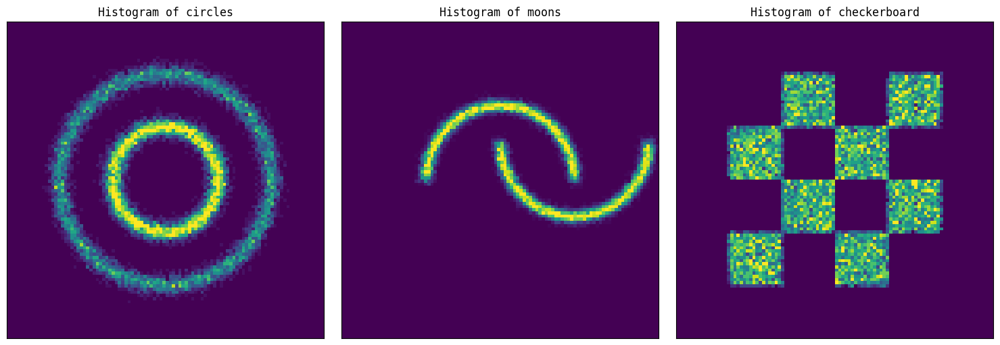

In [45]:
targets = {"circles": CirclesSampleable(device),
           "moons": MoonsSampleable(device, scale = 3.5),
           "checkerboard": CheckerboardSampleable(device, grid_size = 4)}

fig, axes = plt.subplots(1, len(targets), figsize = (5 * len(targets), 5))

num_samples = 20000
num_bins = 100
for idx, (target_name, target) in enumerate(targets.items()):
    ax = axes[idx]
    hist2d_sampleable(target, num_samples, bins = num_bins, scale = 7.5, ax = ax)
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Histogram of {target_name}")
fig.tight_layout()

Let us now implement the linear conditional probability path. Note that because the conditional score for this path is not defined, calling it should raise an exception.

In [46]:
class LinearConditionalProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_simple: Sampleable, p_data: Sampleable):
        """
        Initialize a linear conditional probability path.

        Parameters
        ----------
        p_simple : Sampleable
            Initial (source) distribution.
        p_data : Sampleable
            Target data distribution.
        """
        super().__init__(p_simple, p_data)

    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        """
        Sample data examples z from the data distribution p_data(z).

        Parameters
        ----------
        num_samples : int
            Number of data examples to draw.

        Returns
        -------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        """
        return self.p_data.sample(num_samples)

    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Sample the random variable X_t = (1 - t) X_0 + tz to obtain interpolated
        data samples.

        Parameters
        ----------
        z : torch.Tensor, shape (num_samples, dim)
            Data examples drawn from the data distribution p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1] corresponding to each sample.

        Returns
        -------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated samples drawn from p_t(x|z), representing states along
            the conditional probability path at times t.
        """
        num_samples = z.shape[0]
        x0 = self.p_simple.sample(num_samples)
        x = (1 - t) * x0 + t * z
        return x

    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Compute the conditional vector field u_t(x|z) = (z - x) / (1 - t), des-
        cribing the instantaneous velocity of interpolated samples along the li-
        near conditional path.

        Parameters
        ----------
        x : torch.Tensor, shape (num_samples, dim)
            Interpolated data samples drawn from p_t(x|z).
        z : torch.Tensor, shape (num_samples, dim)
            Conditioning variables, i.e., data examples drawn from p_data(z).
        t : torch.Tensor, shape (num_samples, 1)
            Continuous time points in [0, 1) corresponding to each sample.

        Returns
        -------
        conditional_vector_field : torch.Tensor, shape (num_samples, dim)
            Values of the conditional vector field u_t(x|z).
        """
        conditional_vector_field = (z - x) / (1 - t)
        return conditional_vector_field

    def conditional_score(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        raise Exception("Conditional scores are not defined for linear conditional probability paths.")

100%|██████████| 499/499 [00:00<00:00, 5103.92it/s]


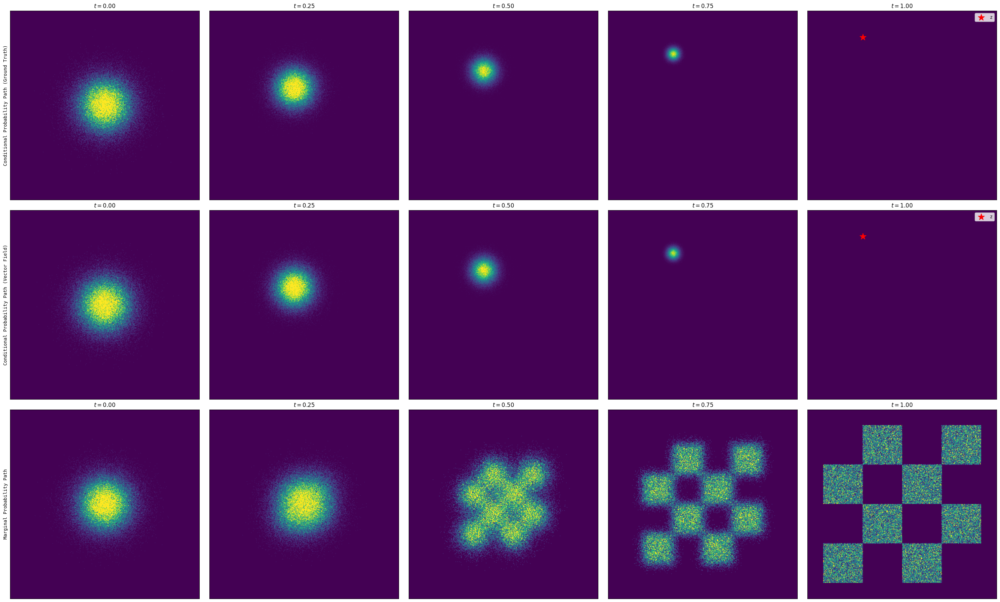

In [47]:
num_samples = 100000
num_timesteps = 500
num_marginals = 5
assert num_timesteps % (num_marginals - 1) == 0

path = LinearConditionalProbabilityPath(p_simple = Gaussian.isotropic(dim = 2, std = 1.0),
                                        p_data = CheckerboardSampleable(device, grid_size = 4)).to(device)
z = path.p_data.sample(1)

fig, axes = plt.subplots(3, num_marginals, figsize = (6 * num_marginals, 6 * 3))
axes = axes.reshape(3, num_marginals)
scale = 6.0

# Conditional probability path (sampling)
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
    zz = z.expand(num_samples, -1)
    tt = t.view(1, 1).expand(num_samples,1)
    xts = path.sample_conditional_path(zz, tt)
    percentile = min(99 + 2 * torch.sin(t).item(), 100)
    hist2d_samples(samples = xts.cpu(), ax = axes[0, idx], bins = 300,
                   scale = scale, percentile = percentile, alpha = 1.0)
    axes[0, idx].set_xlim(-scale, scale)
    axes[0, idx].set_ylim(-scale, scale)
    axes[0, idx].set_xticks([])
    axes[0, idx].set_yticks([])
    axes[0, idx].set_title(f"$t = {t.item():.2f}$")
axes[0, 0].set_ylabel("Conditional Probability Path (Ground Truth)")

axes[0, -1].scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)
axes[0, -1].legend()

# Conditional probability path (vector field)
ode = ConditionalVectorFieldODE(path, z)
simulator = EulerSimulator(ode)
ts = torch.linspace(0, 1, num_timesteps).to(device)
record_every_idxs = record_every(len(ts), len(ts) // (num_marginals - 1))
x0 = path.p_simple.sample(num_samples)
xts = simulator.simulate_with_trajectory(x0, ts.view(1, -1, 1).expand(num_samples, -1, 1))
xts = xts[:, record_every_idxs, :]
for idx in range(xts.shape[1]):
    xx = xts[:, idx, :]
    tt = ts[record_every_idxs[idx]]
    percentile = min(99 + 2 * torch.sin(tt).item(), 100)
    hist2d_samples(samples = xx.cpu(), ax = axes[1, idx], bins = 300, scale = scale, percentile = percentile, alpha = 1.0)
    axes[1, idx].set_xlim(-scale, scale)
    axes[1, idx].set_ylim(-scale, scale)
    axes[1, idx].set_xticks([])
    axes[1, idx].set_yticks([])
    axes[1, idx].set_title(f"$t = {tt.item():.2f}$")
axes[1, 0].set_ylabel("Conditional Probability Path (Vector Field)")

axes[1, -1].scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker = "*", color = "red", s = 200, label = "z", zorder = 20)
axes[1, -1].legend()

# Marginal probability path
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
    zz = z.expand(num_samples, -1)
    tt = t.view(1, 1).expand(num_samples, 1)
    xts = path.sample_marginal_path(tt)
    hist2d_samples(samples = xts.cpu(), ax = axes[2, idx], bins = 300, scale = scale, percentile = 99, alpha = 1.0)
    axes[2, idx].set_xlim(-scale, scale)
    axes[2, idx].set_ylim(-scale, scale)
    axes[2, idx].set_xticks([])
    axes[2, idx].set_yticks([])
    axes[2, idx].set_title(f"$t = {t.item():.2f}$")
axes[2, 0].set_ylabel("Marginal Probability Path")

fig.tight_layout()

Let us now train a flow model using the linear conditional probability path.

In [48]:
path = LinearConditionalProbabilityPath(p_simple = Gaussian.isotropic(dim = 2, std = 1.0),
                                        p_data = CheckerboardSampleable(device, grid_size = 4)).to(device)

linear_flow_model = MLPVectorField(dim = 2, hiddens = [64, 64, 64, 64])
trainer = ConditionalFlowMatchingTrainer(path, linear_flow_model)
losses = trainer.train(num_epochs = 10000, device = device, lr = 1e-3, batch_size = 2000)

Epoch 9999, Loss: 8.302783966064453: 10000it [00:52, 191.15it/s]


100%|██████████| 99/99 [00:00<00:00, 1358.76it/s]


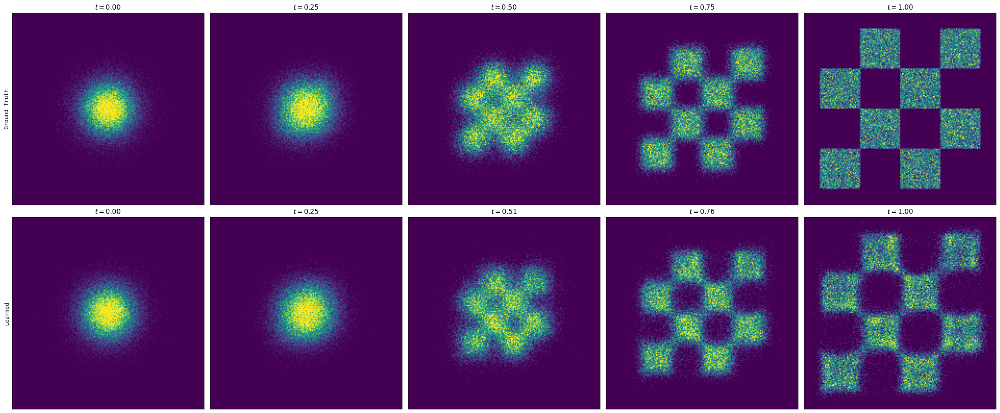

In [49]:
num_samples = 50000
num_marginals = 5

fig, axes = plt.subplots(2, num_marginals, figsize = (5 * num_marginals, 5.25 * 2))
axes = axes.reshape(2, num_marginals)
scale = 6.0

# Samples from ground truth marginal probability path
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
    tt = t.view(1, 1).expand(num_samples, 1)
    xts = path.sample_marginal_path(tt)
    hist2d_samples(samples = xts.cpu(), ax = axes[0, idx], bins = 200, scale = scale, percentile = 99, alpha = 1.0)
    axes[0, idx].set_xlim(-scale, scale)
    axes[0, idx].set_ylim(-scale, scale)
    axes[0, idx].set_xticks([])
    axes[0, idx].set_yticks([])
    axes[0, idx].set_title(f"$t = {t.item():.2f}$")
axes[0, 0].set_ylabel("Ground Truth")

# Samples from propagating the learned marginal vector field
ode = LearnedVectorFieldODE(linear_flow_model)
simulator = EulerSimulator(ode)
ts = torch.linspace(0, 1, 100).to(device)
record_every_idxs = record_every(len(ts), len(ts) // (num_marginals - 1))
x0 = path.p_simple.sample(num_samples)
xts = simulator.simulate_with_trajectory(x0, ts.view(1, -1, 1).expand(num_samples, -1, 1))
xts = xts[:, record_every_idxs, :]
for idx in range(xts.shape[1]):
    xx = xts[:, idx, :]
    hist2d_samples(samples = xx.cpu(), ax = axes[1, idx], bins = 200, scale = scale, percentile = 99, alpha = 1.0)
    axes[1, idx].set_xlim(-scale, scale)
    axes[1, idx].set_ylim(-scale, scale)
    axes[1, idx].set_xticks([])
    axes[1, idx].set_yticks([])
    tt = ts[record_every_idxs[idx]]
    axes[1, idx].set_title(f"$t = {tt.item():.2f}$")
axes[1, 0].set_ylabel("Learned")

fig.tight_layout()

It is possible to bridge between arbitrary starting and target distributions, i.e., $p_\mathrm{simple}$ need not be Gaussian.

In [50]:
path = LinearConditionalProbabilityPath(p_simple = CirclesSampleable(device),
                                        p_data = CheckerboardSampleable(device, grid_size = 4)).to(device)

bridging_flow_model = MLPVectorField(dim = 2, hiddens = [100, 100, 100, 100])

trainer = ConditionalFlowMatchingTrainer(path, bridging_flow_model)
losses = trainer.train(num_epochs = 20000, device = device, lr = 1e-3, batch_size = 2000)

Epoch 19999, Loss: 22.255107879638672: 20000it [01:55, 173.45it/s]


100%|██████████| 199/199 [00:00<00:00, 749.97it/s] 


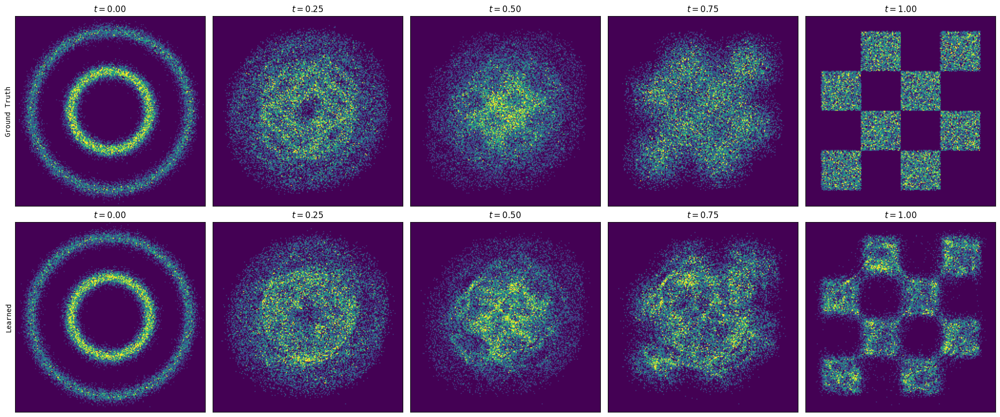

In [51]:
num_samples = 30000
num_marginals = 5

fig, axes = plt.subplots(2, num_marginals, figsize = (4 * num_marginals, 4.25 * 2))
axes = axes.reshape(2, num_marginals)
scale = 6.0

# Samples from ground truth marginal probability path
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
    tt = t.view(1, 1).expand(num_samples, 1)
    xts = path.sample_marginal_path(tt)
    hist2d_samples(samples = xts.cpu(), ax = axes[0, idx], bins = 200, scale = scale, percentile = 99, alpha = 1.0)
    axes[0, idx].set_xlim(-scale, scale)
    axes[0, idx].set_ylim(-scale, scale)
    axes[0, idx].set_xticks([])
    axes[0, idx].set_yticks([])
    axes[0, idx].set_title(f"$t = {t.item():.2f}$")
axes[0, 0].set_ylabel("Ground Truth")

# Samples from propagating the learned marginal vector field
ode = LearnedVectorFieldODE(bridging_flow_model)
simulator = EulerSimulator(ode)
ts = torch.linspace(0, 1, 200).to(device)
record_every_idxs = record_every(len(ts), len(ts) // (num_marginals - 1))
x0 = path.p_simple.sample(num_samples)
xts = simulator.simulate_with_trajectory(x0, ts.view(1, -1, 1).expand(num_samples, -1, 1))
xts = xts[:, record_every_idxs, :]
for idx in range(xts.shape[1]):
    xx = xts[:, idx, :]
    hist2d_samples(samples = xx.cpu(), ax = axes[1, idx], bins = 200, scale = scale, percentile = 99, alpha = 1.0)
    axes[1, idx].set_xlim(-scale, scale)
    axes[1, idx].set_ylim(-scale, scale)
    axes[1, idx].set_xticks([])
    axes[1, idx].set_yticks([])
    tt = ts[record_every_idxs[idx]]
    axes[1, idx].set_title(f"$t = {tt.item():.2f}$")
axes[1, 0].set_ylabel("Learned")

fig.tight_layout()